In [ ]:
# ===========================================
# ✅ STEP 1 – Mount Google Drive
# ===========================================
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# ===========================================
# ✅ STEP 2 – Install YOLO
# ===========================================
!pip install -q ultralytics
from ultralytics import YOLO
import torch, zipfile, shutil, os, glob, matplotlib.pyplot as plt
from IPython.display import Image, display

print("✅ YOLO setup complete!")


✅ YOLO setup complete!


In [ ]:
# ===========================================
# ✅ STEP 3 – Upload your trained model (Option 1)
# ===========================================
print("⬆️ Please upload your trained YOLO model file (best.pt)")
from google.colab import files
uploaded = files.upload()

# Move model to /content
model_path = list(uploaded.keys())[0]
shutil.move(model_path, "/content/best.pt")
print("✅ Model uploaded and saved as /content/best.pt")

# Load YOLO model
model = YOLO("/content/best.pt")
print("✅ Model loaded successfully!")


⬆️ Please upload your trained YOLO model file (best.pt)


Saving best.pt to best (1).pt
✅ Model uploaded and saved as /content/best.pt
✅ Model loaded successfully!


In [ ]:
# ===========================================
# ✅ STEP 4 – Upload test images as ZIP (with auto-folder fix)
# ===========================================
!rm -rf /content/test_images /content/runs/detect/predict*
!mkdir /content/test_images

print("⬆️ Please upload your test_images.zip (contains multiple images to test)")
from google.colab import files
uploaded = files.upload()

# Extract ZIP
zip_path = list(uploaded.keys())[0]
extract_path = "/content/test_images"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Auto-fix nested folder problem
subfolders = [f.path for f in os.scandir(extract_path) if f.is_dir()]
if subfolders:
    for sub in subfolders:
        for file in os.listdir(sub):
            shutil.move(os.path.join(sub, file), extract_path)
        shutil.rmtree(sub)
print("✅ All test images extracted and organized in:", extract_path)


⬆️ Please upload your test_images.zip (contains multiple images to test)


Saving test_images.zip to test_images (3).zip
✅ All test images extracted and organized in: /content/test_images


In [ ]:
# ===========================================
# ✅ STEP 5 – Run YOLO predictions
# ===========================================
results = model.predict(source="/content/test_images", conf=0.5, save=True)
print("✅ Detection complete! Bounding boxes saved in /content/runs/detect/")



image 1/11 /content/test_images/display3.jpeg: 448x640 1 car, 13.1ms
image 2/11 /content/test_images/display5.jpeg: 640x544 1 car, 33.9ms
image 3/11 /content/test_images/displaycone1.jpeg: 640x480 2 cars, 3 cones, 13.6ms
image 4/11 /content/test_images/displaycone3.jpeg: 640x448 1 cone, 1 pedestrain, 25.2ms
image 5/11 /content/test_images/displaycone4.jpeg: 448x640 2 cones, 1 traffic light, 23.1ms
image 6/11 /content/test_images/pedestrain1.jpeg: 640x448 2 pedestrains, 12.7ms
image 7/11 /content/test_images/pedestrain2.jpeg: 448x640 1 pedestrain, 12.6ms
image 8/11 /content/test_images/pedestrain3.jpeg: 448x640 1 pedestrain, 11.8ms
image 9/11 /content/test_images/pedestrain4.jpeg: 448x640 2 pedestrains, 11.8ms
image 10/11 /content/test_images/trafficlight2.jpeg: 480x640 1 traffic light, 12.6ms
image 11/11 /content/test_images/trafficlight3.jpeg: 640x640 1 traffic light, 15.8ms
Speed: 3.9ms preprocess, 16.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved

📂 Showing results from: /content/runs/detect/predict


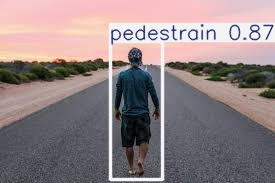

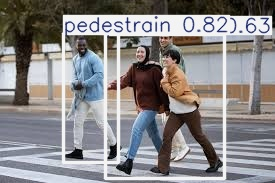

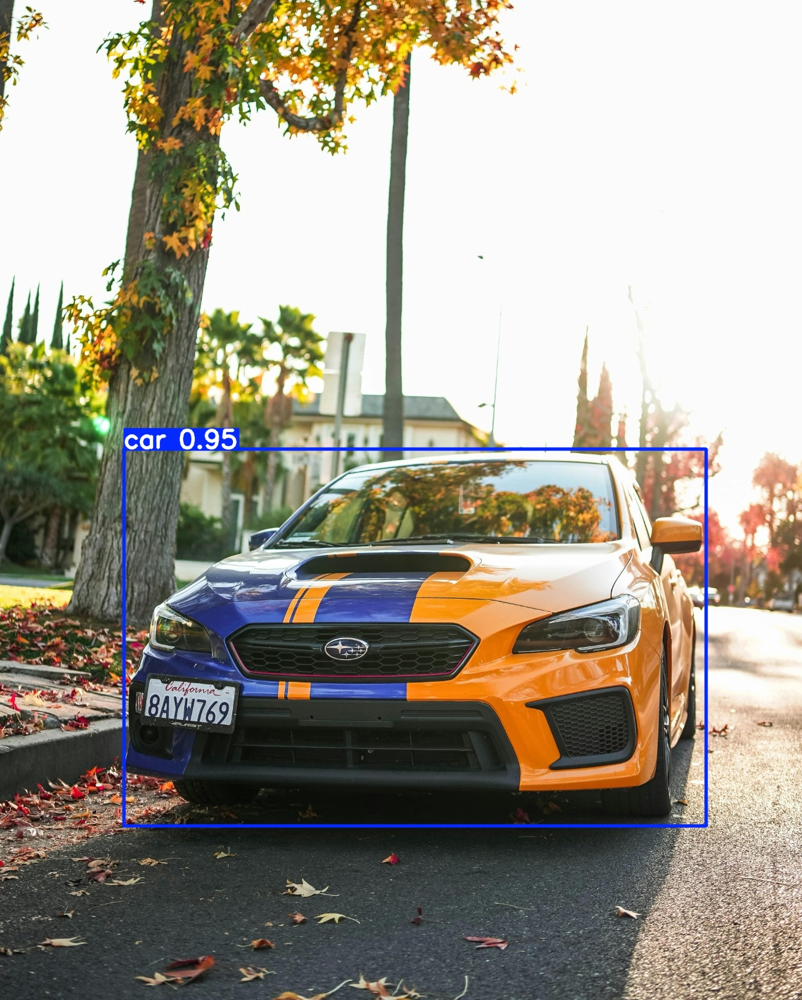

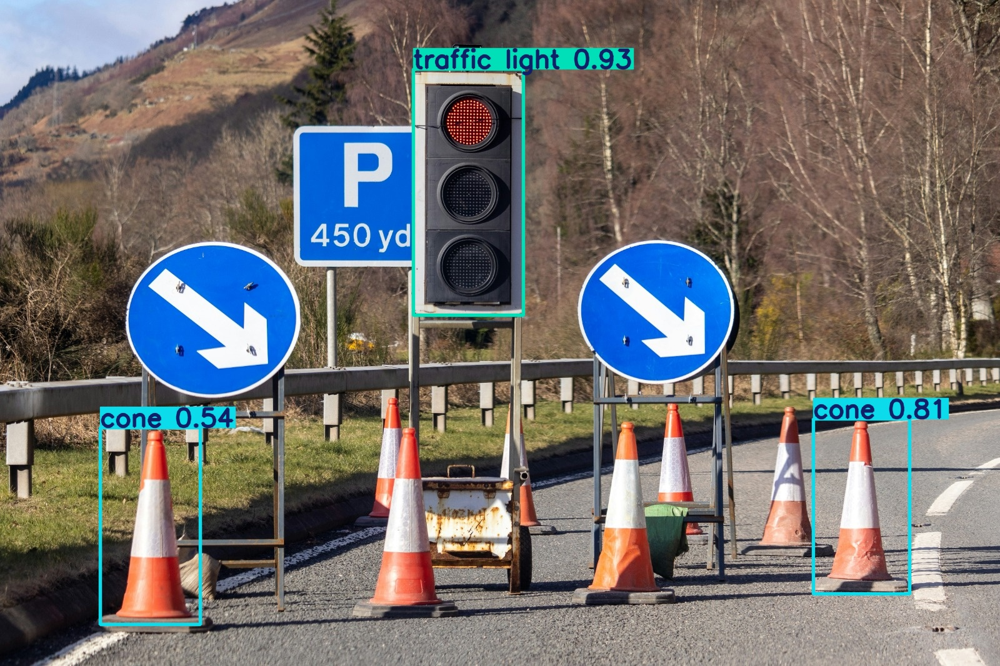

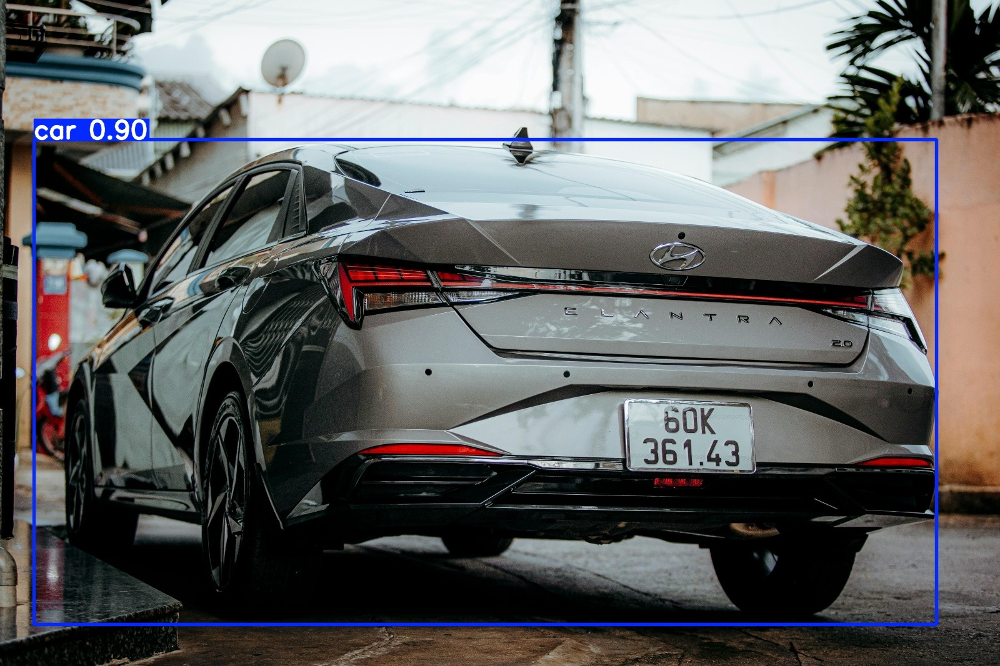

...

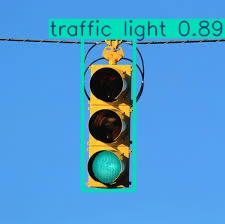

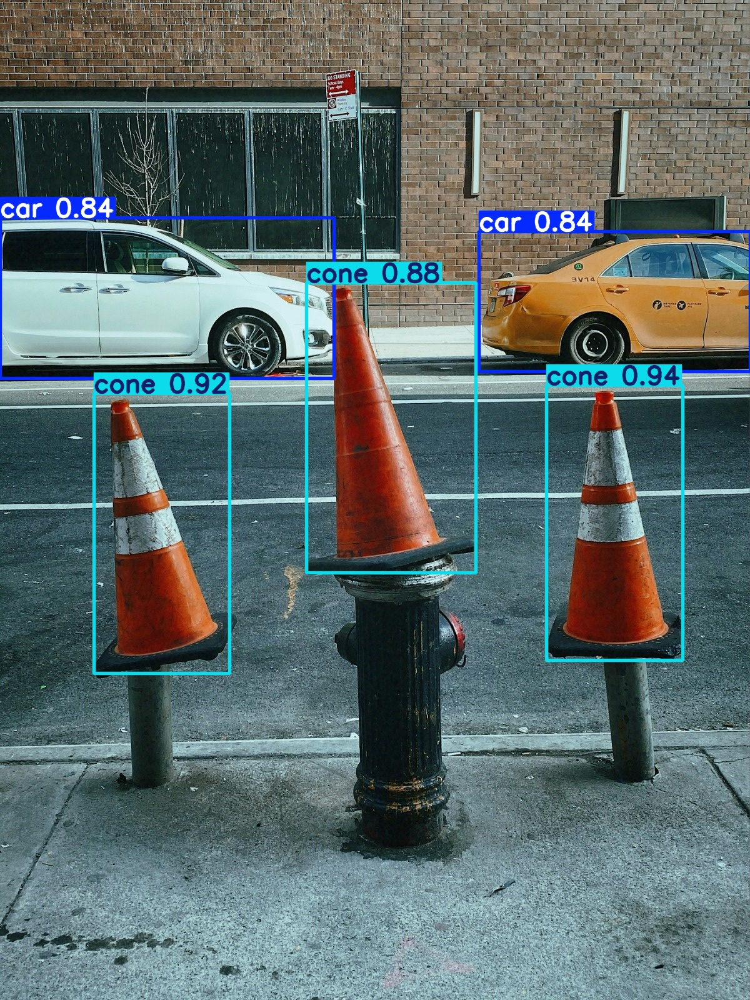

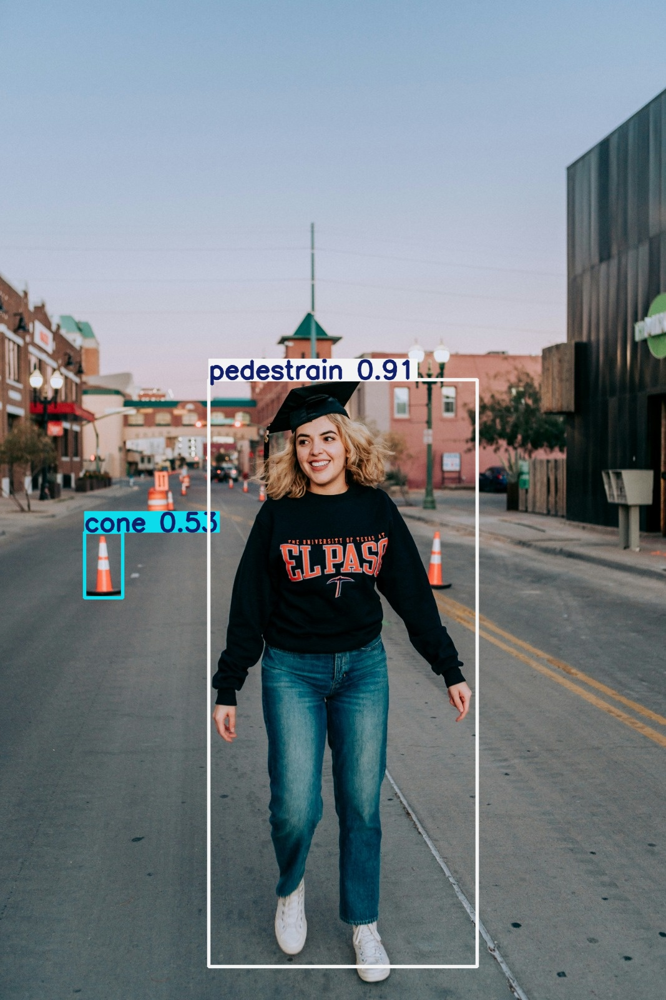

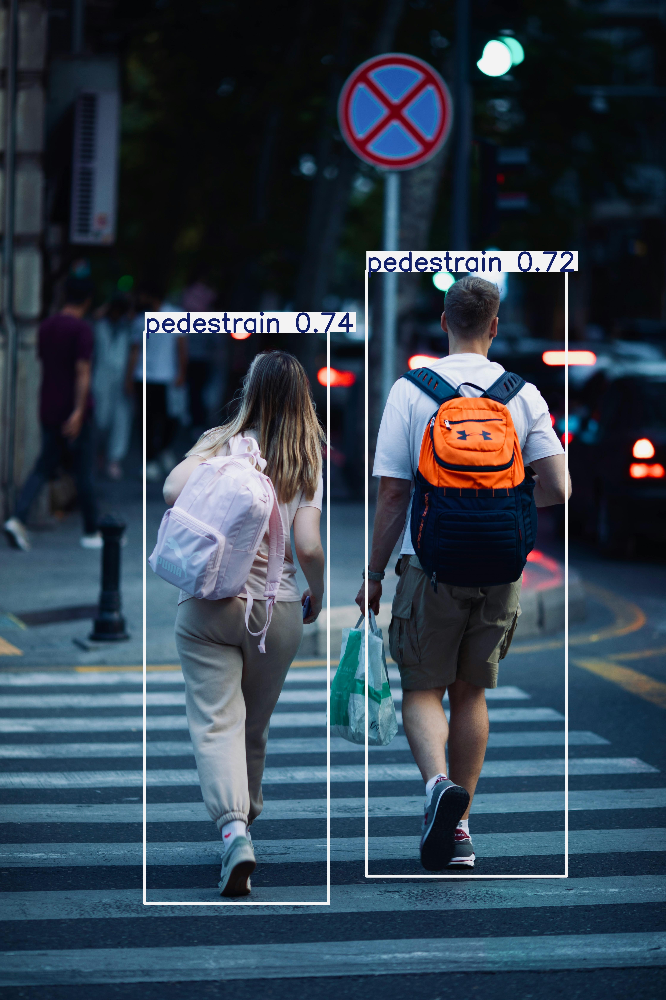

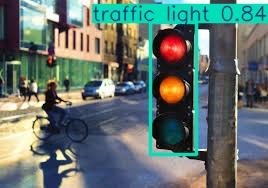

In [ ]:
# ===========================================
# ✅ STEP 6 – Display bounding box results
# ===========================================
latest_folder = sorted(glob.glob('/content/runs/detect/predict*'))[-1]
print(f"📂 Showing results from: {latest_folder}")

for image_path in glob.glob(f'{latest_folder}/*.jpg'):
    display(Image(filename=image_path))


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Car_New_Project.v2i.yolov11.zip to Car_New_Project.v2i.yolov11 (1).zip


In [ ]:
!unzip -o /content/Car_New_Project.v2i.yolov11.zip -d /content/


Streaming output truncated to the last 5000 lines.
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.1b832cdaab0db40bd28b662f46f6bed5.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.7c0e12975e5d1fdf29f114dfec6e6a4d.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.a677bac8ee451c9b8ff5a02209f1e285.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.b333d6784230e191b5c3221cc942865e.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.bb2ed754bdfca7714fa6e99e2c57653a.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.c9fade480a24cc9ceca8ceea8daf7ae9.jpg  
 extracting: /content/train/images/IMG-20251014-WA0283_jpg.rf.0e7bb0527f82b20f48fa3ea29d14cf53.jpg  
 extracting: /content/train/images/IMG-20251014-WA0283_jpg.rf.3d33f632495665dfaeadfad39be1b627.jpg  
 extracting: /content/train/images/IMG-20251014-WA0283_jpg.rf.5de6c7a6f09cff7798e951be88fc6c5b.jpg  
 extracting: /content/train/images/IMG-2

In [ ]:
!ls /content/


 best.pt			        test
'Car_New_Project.v2i.yolov11 (1).zip'   test_images
 Car_New_Project.v2i.yolov11.zip       'test_images (1).zip'
 data.yaml			       'test_images (2).zip'
 drive				       'test_images (3).zip'
 README.dataset.txt		        test_images.zip
 README.roboflow.txt		        train
 runs				        valid
 sample_data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip -o /content/Car_New_Project.v2i.yolov11.zip -d /content/



Streaming output truncated to the last 5000 lines.
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.1b832cdaab0db40bd28b662f46f6bed5.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.7c0e12975e5d1fdf29f114dfec6e6a4d.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.a677bac8ee451c9b8ff5a02209f1e285.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.b333d6784230e191b5c3221cc942865e.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.bb2ed754bdfca7714fa6e99e2c57653a.jpg  
 extracting: /content/train/images/IMG-20251014-WA0282_jpg.rf.c9fade480a24cc9ceca8ceea8daf7ae9.jpg  
 extracting: /content/train/images/IMG-20251014-WA0283_jpg.rf.0e7bb0527f82b20f48fa3ea29d14cf53.jpg  
 extracting: /content/train/images/IMG-20251014-WA0283_jpg.rf.3d33f632495665dfaeadfad39be1b627.jpg  
 extracting: /content/train/images/IMG-20251014-WA0283_jpg.rf.5de6c7a6f09cff7798e951be88fc6c5b.jpg  
 extracting: /content/train/images/IMG-2

In [ ]:
# ===========================================
# ✅ STEP 7 – Evaluate Model Performance and Plot Graph
# ===========================================

from ultralytics import YOLO
import matplotlib.pyplot as plt

print("📊 Evaluating model performance...")

# ✅ Load your trained model (ensure best.pt exists in /content)
model = YOLO("/content/best.pt")

# ✅ Point to your correct data.yaml path
data_path = "/content/data.yaml"

# ✅ Run validation on your trained model
metrics = model.val(data=data_path)

# ✅ Extract key metrics safely
precision = metrics.results_dict.get("metrics/precision(B)", 0)
recall = metrics.results_dict.get("metrics/recall(B)", 0)
map50 = metrics.results_dict.get("metrics/mAP50(B)", 0)
map5095 = metrics.results_dict.get("metrics/mAP50-95(B)", 0)

print(f"\nPrecision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"mAP@50: {map50:.2f}")
print(f"mAP@50–95: {map5095:.2f}")

# ✅ Plot Graph
plt.figure(figsize=(8,5))
bars = plt.bar(
    ["Precision", "Recall", "mAP@50", "mAP@50–95"],
    [precision, recall, map50, map5095],
    color=["#4caf50", "#2196f3", "#ff9800", "#9c27b0"]
)

plt.title("YOLOv11 Model Performance", fontsize=14, weight='bold')
plt.ylabel("Score", fontsize=12)
plt.ylim(0, 1)
plt.grid(axis="y", linestyle="--", alpha=0.6)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", ha='center', fontsize=10)

plt.show()
print("🎯 Graph generated successfully!")
